In [2]:
import ICAtacarma as ICA

cum_file = ICA.h5_data('cum.h5')

cum_filt.h5
mask applied from cum_filt.h5 file


1308
12.679863929748535
5.100197792053223
16.719242095947266
15.747901916503906
6.3101654052734375
4.305865287780762
9.75503921508789
100.45218658447266


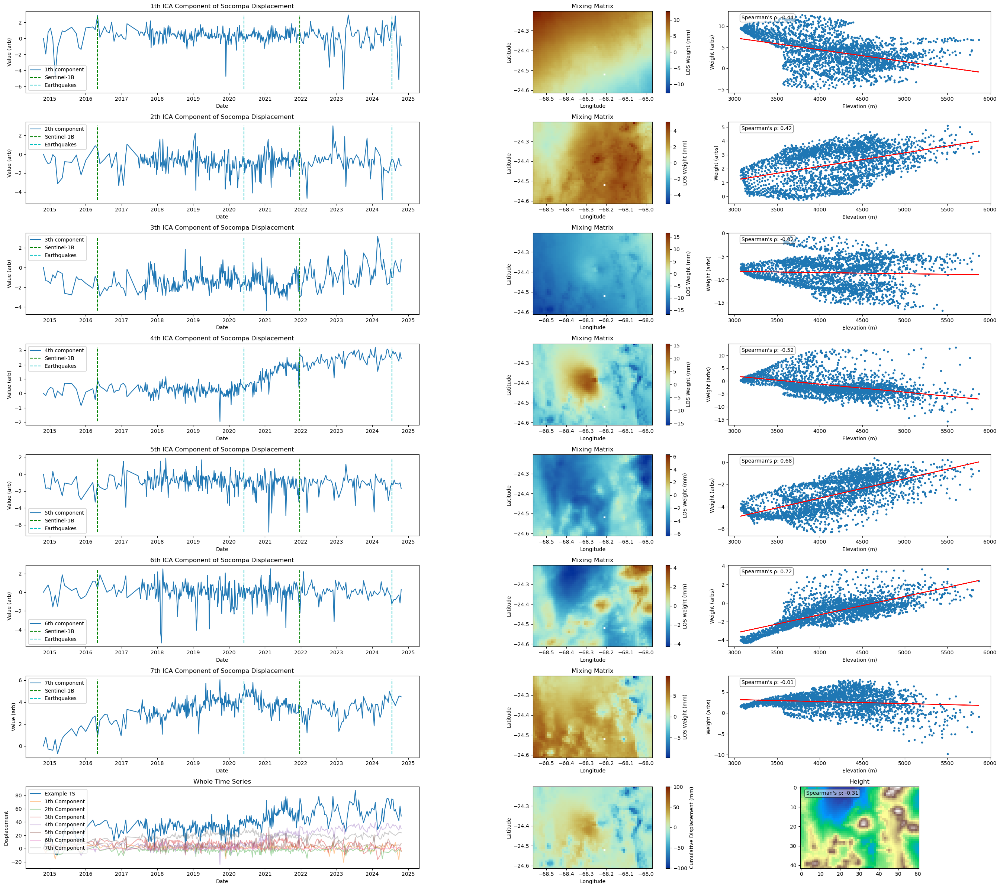

In [3]:
import pandas as pd

sentinel_1_b = ICA.important_dates((pd.to_datetime("04-28-2016"), pd.to_datetime("12-23-2021")),'Sentinel-1B','g')
earthquakes = ICA.important_dates((pd.to_datetime("06-03-2020"), pd.to_datetime("7-19-2024")),'Earthquakes','c')

important_dates = [sentinel_1_b, earthquakes]

n_comp=7

socompa = ICA.ICA_area(cum_file,"Socompa",(136,178),(68,129))
socompa.perform_ICA(n_comp,True)
socompa.plot_ICA(date_list=important_dates)


C:\Users\py20bk\Documents\Python\Socompa TS analysis\desc\cum_filt.h5
mask not found and therefore not applied
1328
16.130443572998047
32.09095764160156
5.475662708282471
13.113126754760742
151.94517517089844


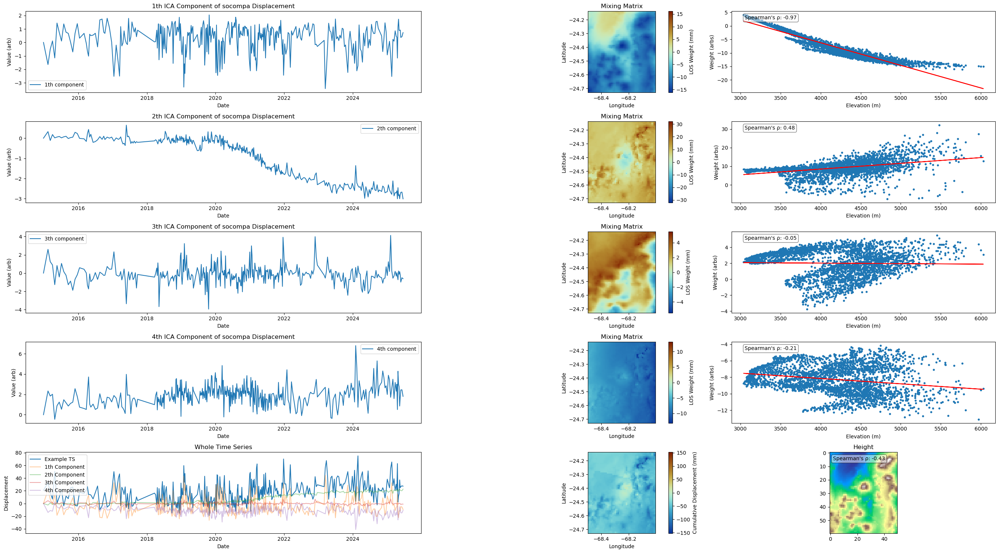

In [4]:
cum_156D_11424_131313 = ICA.h5_data(r'C:\Users\py20bk\Documents\Python\Socompa TS analysis\desc\cum.h5')

n_comp=4

socompa_156D = ICA.ICA_area(cum_156D_11424_131313, "socompa", (130,190), (190,240))
socompa_156D.remove_time((0,1,2))
socompa_156D.perform_ICA(n_comp,False)
socompa_156D.plot_ICA()

(datetime.datetime(2020, 11, 6, 0, 0), datetime.datetime(2020, 4, 22, 0, 0))
(datetime.datetime(2020, 6, 10, 0, 0), datetime.datetime(2019, 10, 20, 0, 0))
[2.69403706e-05 2.29104130e+00 2.05339084e+03 4.52956259e-02]
[5.83948139e-04 8.50795282e-01 2.41774217e+01 4.16175731e-03]
[ 1.09554628e-04 -7.23677229e-02  2.00470375e+03  2.39733971e-03]
[2.64276483e-05 3.75236308e-02 1.82128884e+01 1.16907317e-04]
(Timestamp('2020-06-10 09:22:48.168023908'), 24.177421656235442)
(Timestamp('2020-06-22 16:53:23.580925267'), 18.21288843979089)


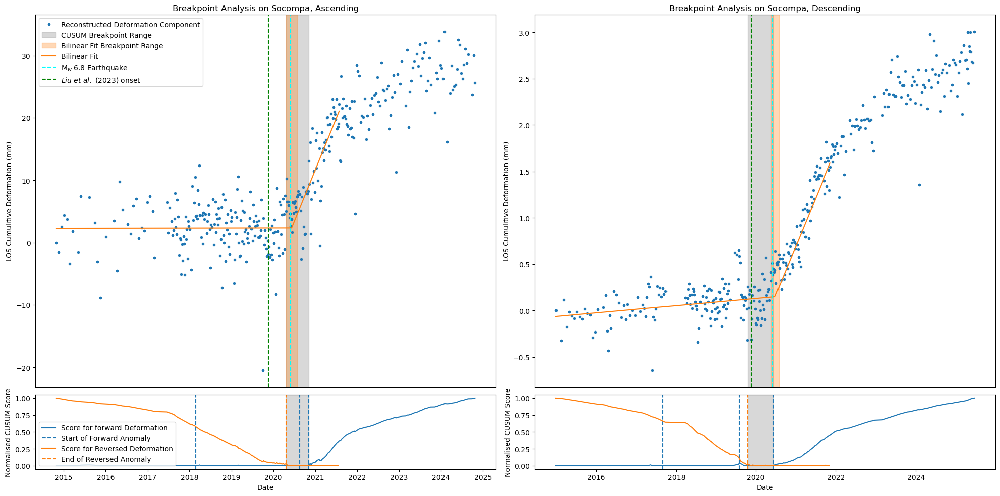

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress
from scipy.optimize import curve_fit
from datetime import datetime, timedelta

def CUSUM_adaptive_upper(x, threshold, first_n = False):
    score = np.zeros(len(x))
    z = np.zeros(len(x))
    if first_n:
        mean = np.mean(x[:first_n])
        std = np.std(x[:first_n])
    else:
        mean = np.mean(x[:2])
        std = np.std(x[:2])
        first_n=1

    for i, xi in enumerate(x[:]):
        zi = (xi - mean)/std

        #print(zi, xi, mean, std)

        #print(score[i])
        score[i]=max((0, score[i-1] + zi - threshold * std))

        if i >= first_n:
            mean = np.mean(x[:i+1])
            std = np.std(x[:i+1])

        z[i]=zi
    return score

import numpy as np

def cusum(data, first_n=5, k=0.5, h=5):
    """
    Compute the CUSUM for a 1D array of data.
    
    Parameters:
        data (list or np.array): Input data series.
        first_n (int): Minimum number of points to use for initial statistics.
        k (float): Reference value (often half the shift to detect).
        h (float): Decision interval (threshold for detecting a shift).
    
    Returns:
        tuple: (positive_cusum, negative_cusum)
    """
    data = np.asarray(data)
    n = len(data)
    pos_cusum = np.zeros(n)
    neg_cusum = np.zeros(n)

    for i in range(1, n):
        if i < first_n:
            window = data[:first_n]
        else:
            window = data[:i]
        
        mean = np.mean(window)
        std = np.std(window, ddof=1)  # sample std deviation

        # Standardized value
        z = (data[i] - mean) / std if std > 0 else 0

        # Update CUSUMs
        pos_cusum[i] = max(0, pos_cusum[i-1] + z - k)
        neg_cusum[i] = min(0, neg_cusum[i-1] + z + k)

        # Optional: Add threshold logic if needed
        # if pos_cusum[i] > h or neg_cusum[i] < -h:
        #     print(f"Shift detected at index {i}")

    return pos_cusum, neg_cusum

def bilinear(t, v1, c1, t0, v2):
        c2 = t0*(-v2)
        before_t0 = v1*t + c1
        after_t0 = v2*t + c2
        return before_t0 + heaviside(t,t0)*after_t0

def heaviside(x, x0):
        x=x-x0
        return np.heaviside(x,1)

def convert_to_date(first_epoc,day_since_first_epoc):
        # Convert the start date to a datetime object
        start_date = pd.to_datetime(first_epoc, format='%Y%m%d')
        
        # Calculate the new date by adding the number of days
        new_date = start_date + pd.to_timedelta(day_since_first_epoc, unit='D')
        return new_date

def CUSUM_plot(ax, ts, ts_x, ts_dates, detrend = (False, False), threshold=1.5, first_n = 5, min_len=5, breaks_to_plot = [-1,-1], plot_detrend = False):
    ax[0].plot(ts_dates, ts, ".", label = "Reconstructed Deformation Component")

    if detrend[0]:
        if plot_detrend:
            ax[0].axvline(ts_dates[detrend[0][0]],ls=":")
            ax[0].axvline(ts_dates[detrend[0][1]],ls=":")
        i_from, i_to = detrend[0][0], detrend[0][1]
        slope,_,_,_,_ = linregress(ts_x[i_from:i_to],ts[i_from:i_to])
        temp_ts = ts - slope * ts_x
        cs=cusum(temp_ts,first_n,threshold)[0]
    else:
        cs=cusum(ts,first_n,threshold)[0]

    breaks = []
    for i in range(len(ts)):
        if cs[i] != 0:
            run += 1
        else:
            run=0
    
        if run == min_len:
            breaks.append(ts_dates[i])

    ax[1].plot(ts_dates,cs/max(cs), label = "Score for forward Deformation")
    ax[1].axvline(breaks[0],ls="--", label = "Start of Forward Anomaly")
    for b in breaks[1:]:
        ax[1].axvline(b,ls="--")
    forward_bp = breaks[breaks_to_plot[0]]
    
    ax[0].set_ylabel("LOS Cumulitive Deformation (mm)")
    ax[0].set_xticks([])
    ax[1].set_ylabel("Normalised CUSUM Score")
    ax[1].set_xlabel("Date")

    if detrend[1]:
        if plot_detrend:
            ax[0].axvline(ts_dates[detrend[1][0]],color="tab:orange",ls=":")
            ax[0].axvline(ts_dates[detrend[1][1]],color="tab:orange",ls=":")
        i_from, i_to = detrend[1][0], detrend[1][1]
        slope,_,_,_,_ = linregress(ts_x[i_from:i_to],ts[i_from:i_to][::-1])
        temp_ts = ts[::-1] - slope * ts_x
        reverse_i_start = len(temp_ts)-i_to
        if plot_detrend:
            ax[0].plot(ts_dates[::-1][reverse_i_start:], temp_ts[reverse_i_start:], ".")
        cs=cusum(temp_ts[reverse_i_start:],first_n,threshold)[0]
    else:
        cs=cusum(ts[::-1],first_n,threshold)[0]
        reverse_i_start = 0

    breaks = []
    ts_dates_temp = ts_dates[::-1][reverse_i_start:]
    for i in range(len(cs)):
        if cs[i] != 0:
            run += 1
        else:
            run=0
    
        if run == min_len:
            breaks.append(ts_dates_temp[i])

    ax[1].plot(ts_dates_temp,cs/max(cs), label = "Score for Reversed Deformation")

    ax[1].axvline(breaks[0],linestyle="dashed",color="tab:orange", label = "End of Reversed Anomaly")
    for b in breaks[1:]:
        ax[1].axvline(b,linestyle="dashed",color="tab:orange")
    backwards_bp = breaks[breaks_to_plot[1]]

    ax[0].axvspan(forward_bp, backwards_bp, color='grey', alpha=0.3, label = "CUSUM Breakpoint Range")
    ax[1].axvspan(forward_bp, backwards_bp, color='grey', alpha=0.3)

   
    return forward_bp, backwards_bp

def bl_fit_plots(ax, ts, ts_x, ts_dates, fit_range_i = False, p0=False):
    if fit_range_i:
        i_start = fit_range_i[0]
        i_stop = fit_range_i[1]
    else:
        i_start = 0
        i_stop = -1
    if p0:
        popt, perr = curve_fit(bilinear, ts_x[i_start:i_stop], ts[i_start:i_stop], p0)
    else:
        popt, perr = curve_fit(bilinear, ts_x[i_start:i_stop], ts[i_start:i_stop])
    perr = np.sqrt(np.diag(perr))

    print(popt)
    print(perr)

    t0_stamp = convert_to_date(ts_dates[0],popt[2])
    t0_err_stamp = timedelta(days=perr[2])

    ax.axvspan(t0_stamp + 2* t0_err_stamp,t0_stamp - 2* t0_err_stamp , color='tab:orange', alpha=0.3, label = "Bilinear Fit Breakpoint Range")

    bl_x = np.array([ts_x[i_start],popt[2],ts_x[i_stop]])
    bl_dates = [ts_dates[i_start],t0_stamp,ts_dates[i_stop]]
    bl_y = bilinear(bl_x,*popt)
    ax.plot(bl_dates,bl_y, label = "Bilinear Fit")

    return t0_stamp, perr[2]

def detrend_to_fit_range(detrend):
    fit_range = [0,-1]
    if detrend[0]:
        fit_range[0]=detrend[0][0]
    if detrend[1]:
        fit_range[1]=detrend[1][1]
    return fit_range

earthquake_day=pd.to_datetime("06-03-2020")
Fei_onset_day=pd.to_datetime("11-19-2019")

temp=socompa.get_component(3,30,20)
temp_x_d=socompa.x_dates
temp_x = socompa.x

temp_desc=socompa_156D.get_component(1)*-1
temp_x_d_desc=socompa_156D.x_dates
temp_x_desc = socompa_156D.x

fig, ax = plt.subplots(2,2, figsize = (20,10), height_ratios = (5,1))

asc_detrend_ranges = [(0,100), (220,260)]
desc_detrend_ranges = [(0,100), (220,250)]
threshold = 1


asc_bp = CUSUM_plot(ax[:,0], temp, temp_x, temp_x_d, asc_detrend_ranges, threshold = threshold)
desc_bp = CUSUM_plot(ax[:,1], temp_desc, temp_x_desc, temp_x_d_desc, desc_detrend_ranges, threshold = threshold)


print(asc_bp)
print(desc_bp)
#ax[0][0].plot([temp_x_d[0],convert_to_date(temp_x_d[0],365*5),temp_x_d[260]],bilinear(np.array([temp_x[0],365*5,temp_x[260]]),*[0,0,5*365,7/365]))
asc_bp = bl_fit_plots(ax[0][0], temp, temp_x, temp_x_d, detrend_to_fit_range(asc_detrend_ranges),[0,0,5*365,7/365])#v1, c1, t0, v2)
desc_bp = bl_fit_plots(ax[0][1], temp_desc, temp_x_desc, temp_x_d_desc, detrend_to_fit_range(desc_detrend_ranges),[0,0,5*365,7/365])
print(asc_bp)
print(desc_bp)

ax[0,0].axvline(earthquake_day,ls="--",color="cyan",label = "M$_w$ 6.8 Earthquake")
ax[0,1].axvline(earthquake_day,ls="--",color="cyan",label = "M$_w$ 6.8 Earthquake")

ax[0,0].axvline(Fei_onset_day,ls="--",color="green", label = r"$\mathit{Liu\ et\ al.}$ (2023) onset")
ax[0,1].axvline(Fei_onset_day,ls="--",color="green", label = r"$\mathit{Liu\ et\ al.}$ (2023) onset")

ax[0][0].legend()
ax[1][0].legend()
ax[0][0].set_title("Breakpoint Analysis on Socompa, Ascending")
ax[0][1].set_title("Breakpoint Analysis on Socompa, Descending")

plt.tight_layout()
plt.savefig(fr"C:\Users\py20bk\Documents\Python\Figures\Transfer\BP_{threshold}.png")
#ax[1][0].legend()
#ax[1][1].legend()

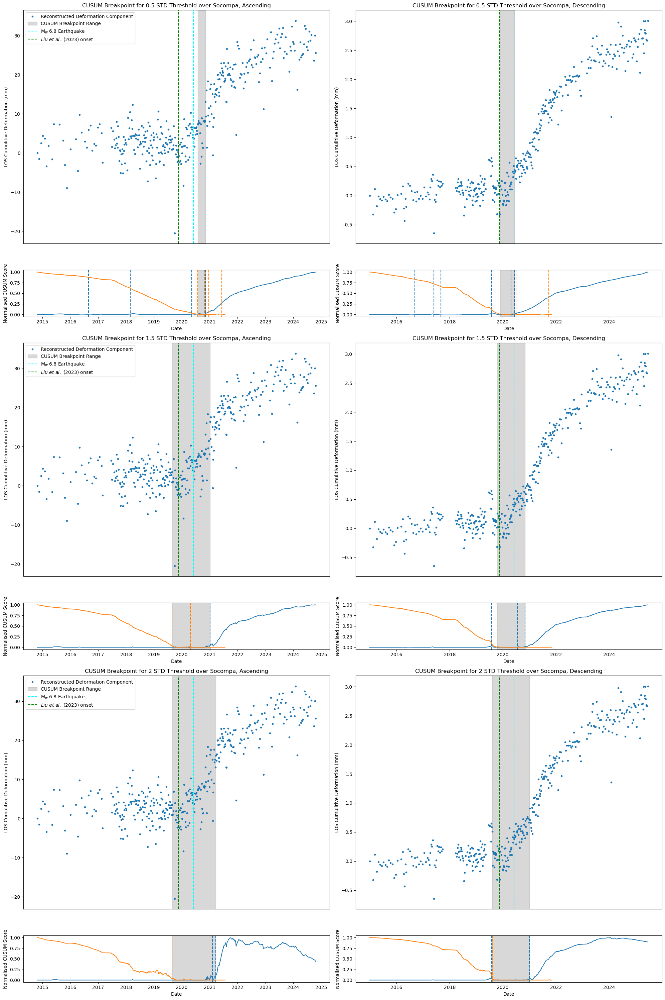

In [13]:
thresholds = (0.5,1.5,2)

asc_detrend_ranges = [(0,100), (220,260)]
desc_detrend_ranges = [(0,100), (220,250)]

fig, ax = plt.subplots(6,2, figsize = (20,30), height_ratios = (5,1,5,1,5,1))

for i, threshold in enumerate(thresholds):
    index_0, index_1 = 2*i, 2*i+2

    asc_bp = CUSUM_plot(ax[index_0:index_1,0], temp, temp_x, temp_x_d, asc_detrend_ranges, threshold = threshold)
    desc_bp = CUSUM_plot(ax[index_0:index_1,1], temp_desc, temp_x_desc, temp_x_d_desc, desc_detrend_ranges, threshold = threshold)
    
    ax[index_0,0].axvline(earthquake_day,ls="--",color="cyan",label = "M$_w$ 6.8 Earthquake")
    ax[index_0,1].axvline(earthquake_day,ls="--",color="cyan",label = "M$_w$ 6.8 Earthquake")
    
    ax[index_0,0].axvline(Fei_onset_day,ls="--",color="green", label = r"$\mathit{Liu\ et\ al.}$ (2023) onset")
    ax[index_0,1].axvline(Fei_onset_day,ls="--",color="green", label = r"$\mathit{Liu\ et\ al.}$ (2023) onset")
    
    ax[index_0][0].legend()
    ax[index_0][0].legend()
    ax[index_0][0].set_title(f"CUSUM Breakpoint for {threshold} STD Threshold over Socompa, Ascending")
    ax[index_0][1].set_title(f"CUSUM Breakpoint for {threshold} STD Threshold over Socompa, Descending")

plt.tight_layout()
plt.savefig(r"C:\Users\py20bk\Documents\Python\Figures\Transfer\CUSUM_trhesholds.png")

In [23]:
cs=cusum(temp,10,1)[0]
min_in_row = 5
breaks = []
for i in range(len(temp)):
    if cs[i] != 0:
        run += 1
    else:
        run=0

    if run == min_in_row:
        print(min_in_row)
        breaks.append(temp_x_d[i])

print(breaks)

5
5
5
[datetime.datetime(2020, 5, 10, 0, 0), datetime.datetime(2020, 8, 20, 0, 0), datetime.datetime(2020, 11, 6, 0, 0)]


1308


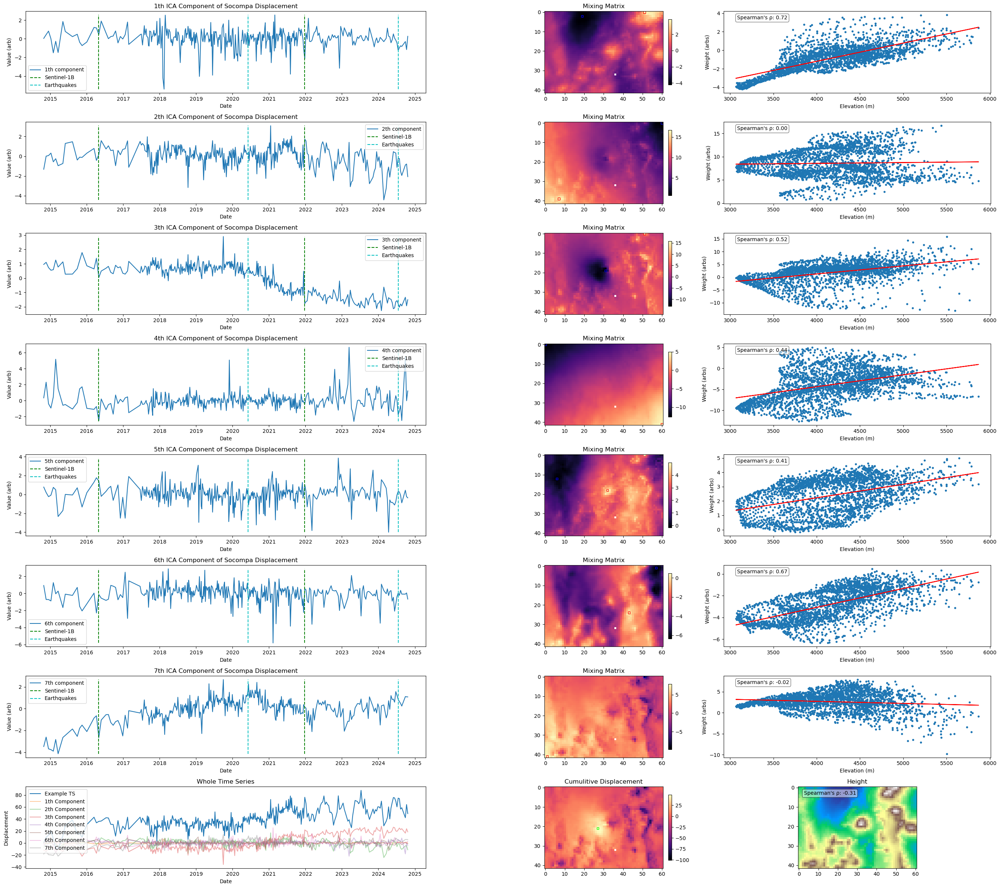

In [3]:
n_comp=7

socompa = ICA.ICA_area(cum_file,"Socompa",(136,178),(68,129))
socompa.perform_ICA(n_comp,True)
socompa.plot_ICA(date_list=important_dates)

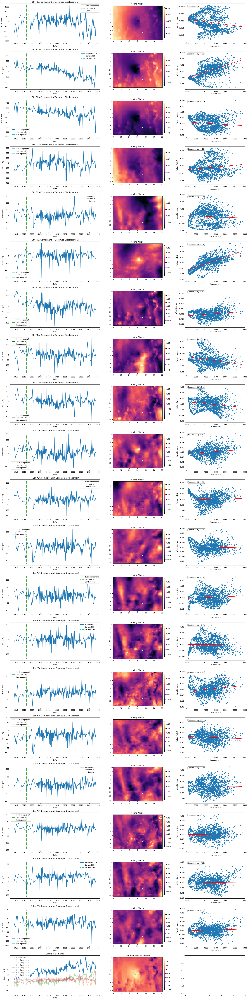

In [4]:
socompa.plot_PCA(20,important_dates)

1694


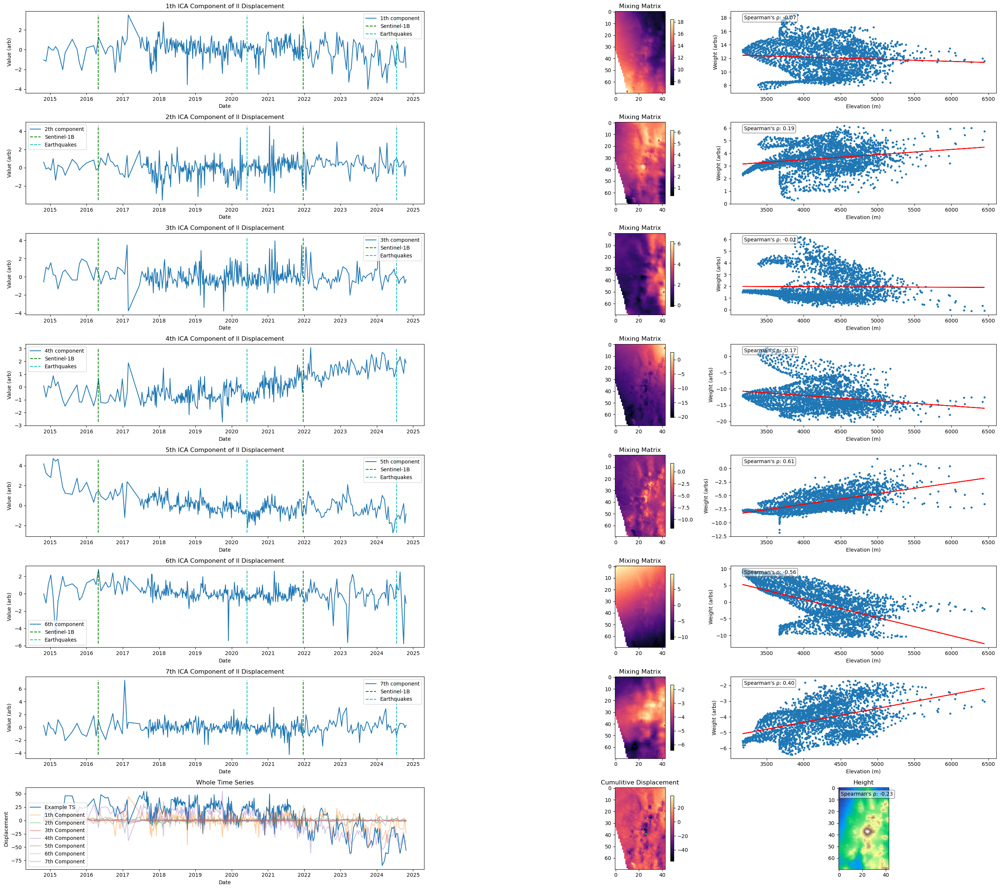

In [21]:
import pandas as pd

sentinel_1_b = ICA.important_dates((pd.to_datetime("04-28-2016"), pd.to_datetime("12-23-2021")),'Sentinel-1B','g')
earthquakes = ICA.important_dates((pd.to_datetime("06-03-2020"), pd.to_datetime("7-19-2024")),'Earthquakes','c')

important_dates = [sentinel_1_b, earthquakes]


n_comp=7

ll = ICA.ICA_area(cum_file,"ll",(150,220),(46,89))
ll.perform_ICA(n_comp,True)
ll.plot_ICA("min",date_list=important_dates)

834
9.154768943786621
8.565354347229004
5.420638561248779
2.8955116271972656
6.420189380645752
26.154298782348633
4.4036431312561035
5.202201843261719
3.4681711196899414
2.3980000019073486
55.979881286621094


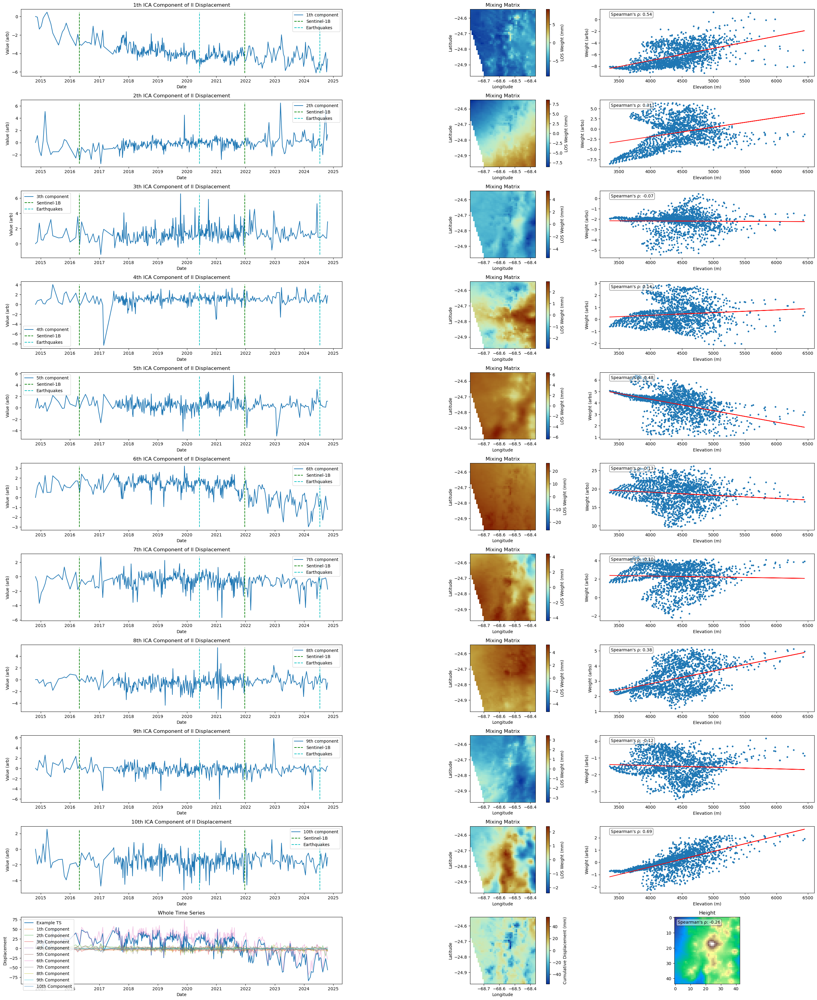

In [6]:
ll = ICA.ICA_area(cum_file,"ll",(170,214),(46,89))
ll.perform_ICA(10,True)
ll.plot_ICA("min",date_list=important_dates)